
**任務:** 根據original_data 樣本,建立模型,對test_data的圖片進行普通/其他蘋果判斷
1. 數據增強,擴充確認為普通蘋果的樣本數量
1. 特征提取,使用VGG16模型提取圖像特征
1. 圖像批量處理
1. Kmeans模型嘗試普通/其他蘋果聚類
1. 基於標簽數據矯正結果,並可視化
1. Meanshift模型提升模型表現
1. 數據降維PCA處理,提升模型表現

特點: 樣本少,部分標註(且都是正樣本)、負樣本類別不可窮盡、圖像處理

In [1]:
#数据增强 
from keras.preprocessing.image import ImageDataGenerator
path = "./dataset/trainsferlearning/original_data"
dst_path = "./dataset/trainsferlearning/train_data"

datagen = ImageDataGenerator(rotation_range=10, # 旋轉範圍
                             width_shift_range=0.1, # 水平平移範圍
                             height_shift_range=0.02, # 垂直平移範圍
                             horizontal_flip=True, # 水平翻轉
                             vertical_flip=True) # 垂直翻轉
gen = datagen.flow_from_directory(path,
                                  target_size=(224,224), # 所有圖像調整為統一尺寸，vgg16的輸入大小是224*224
                                  batch_size=2, # 一次生成兩張
                                  save_to_dir=dst_path, # 保存路徑
                                  save_prefix="gen_", # 保存圖片文件名前綴
                                  save_format="jpg") # 默認png
# 一次生成2張，理論上是生成batch_size*循環次數也就是200張，但是實際只生成180不知道爲什麽
# 然後batch_size > 文件夾中圖片數量也只會按文件夾中圖片數量最大來生成 
for i in range(100):
    gen.next()

Found 9 images belonging to 1 classes.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


**单张图片展示 特征提取**

In [3]:
# load the image
# from keras.preprocessing import load_img,img_to_array # keras2.6后取消
from keras.utils import load_img,img_to_array

img_path = r"./dataset/trainsferlearning/train_data/4.jpg"
img = load_img(img_path,target_size=(224,224))
print(type(img))

<class 'PIL.Image.Image'>


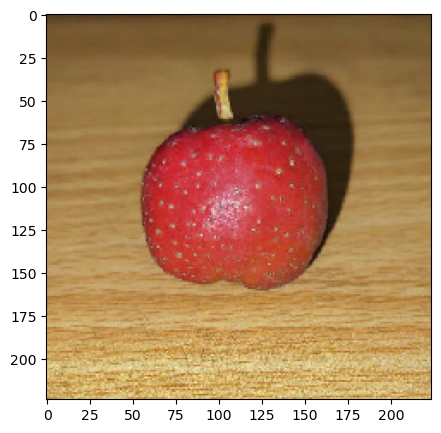

In [4]:
from matplotlib import pyplot as plt
fig1 = plt.figure(figsize=(5,5))
plt.imshow(img)

In [5]:
img = img_to_array(img)
type(img)

numpy.ndarray

In [6]:
#加载模型
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
import numpy as np
model_vgg = VGG16(weights="imagenet",include_top=False)
X = np.expand_dims(img,axis=0)#增加一个维度
X = preprocess_input(X)
print(X.shape)

(1, 224, 224, 3)


In [7]:
#特征提取
features = model_vgg.predict(X)
print(features.shape)

1/1 [==============================] - 1s 1s/step
(1, 7, 7, 512)


In [8]:
features = features.reshape(1,7*7*512)
print(features.shape)

(1, 25088)


**批量提取**

In [9]:
# list all the names of the data
import os 
folder = r"./dataset/trainsferlearning/train_data"
dirs = os.listdir(folder)
# print(dirs)
img_path = []
for i in dirs:
    if os.path.splitext(i)[1] == ".jpg":
        img_path.append(f'{folder}/{i}')
print(img_path[0])

./dataset/trainsferlearning/train_data/1.jpg


In [10]:
# define a method to extract the features
def modelProcess(img_path, model):
    img = load_img(img_path,target_size=(224,224))
    img = img_to_array(img)
    x = np.expand_dims(img,axis=0)
    x = preprocess_input(x)
    x_vgg = model.predict(x)
    x_vgg = x_vgg.reshape(1,25088)
    
    return x_vgg

In [11]:
# 圖像批量處理
features_train = np.zeros([len(img_path),7*7*512])
for i in range(len(img_path)):
    features_i = modelProcess(img_path[i],model_vgg)
    print("preprocessed:",img_path[i])
    features_train[i] = features_i

1/1 [==============================] - 0s 140ms/step
preprocessed: ./dataset/trainsferlearning/train_data/1.jpg
1/1 [==============================] - 0s 145ms/step
preprocessed: ./dataset/trainsferlearning/train_data/2.jpg
1/1 [==============================] - 0s 145ms/step
preprocessed: ./dataset/trainsferlearning/train_data/3.jpg
1/1 [==============================] - 0s 150ms/step
preprocessed: ./dataset/trainsferlearning/train_data/4.jpg
1/1 [==============================] - 0s 144ms/step
preprocessed: ./dataset/trainsferlearning/train_data/5.jpg
1/1 [==============================] - 0s 144ms/step
preprocessed: ./dataset/trainsferlearning/train_data/6.jpg
1/1 [==============================] - 0s 146ms/step
preprocessed: ./dataset/trainsferlearning/train_data/7.jpg
1/1 [==============================] - 0s 142ms/step
preprocessed: ./dataset/trainsferlearning/train_data/8.jpg
1/1 [==============================] - 0s 148ms/step
preprocessed: ./dataset/trainsferlearning/train_dat

1/1 [==============================] - 0s 149ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__2_9779501.jpg
1/1 [==============================] - 0s 145ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__2_9944327.jpg
1/1 [==============================] - 0s 144ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__3_1162239.jpg
1/1 [==============================] - 0s 143ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__3_1669850.jpg
1/1 [==============================] - 0s 144ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__3_1972974.jpg
1/1 [==============================] - 0s 151ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__3_2436015.jpg
1/1 [==============================] - 0s 143ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__3_323757.jpg
1/1 [==============================] - 0s 142ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__3_3341496.jpg
1

1/1 [==============================] - 0s 152ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_4065581.jpg
1/1 [==============================] - 0s 151ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_4194933.jpg
1/1 [==============================] - 0s 153ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_4837220.jpg
1/1 [==============================] - 0s 152ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_5258107.jpg
1/1 [==============================] - 0s 159ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_5459237.jpg
1/1 [==============================] - 0s 150ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_5463259.jpg
1/1 [==============================] - 0s 146ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_5467633.jpg
1/1 [==============================] - 0s 150ms/step
preprocessed: ./dataset/trainsferlearning/train_data/gen__6_6941075.jpg


1/1 [==============================] - 0s 145ms/step
preprocessed: ./dataset/trainsferlearning/train_data/oter_9.jpg


In [12]:
print(features_train.shape)

(200, 25088)


20个山楂中有9个是普通山楂 180个是数据增强的

In [14]:
#define X
X = features_train

In [15]:
# set up a kmeans un-supervised model
from sklearn.cluster import KMeans
cnn_kmeans = KMeans(n_clusters=2,max_iter=2000)
cnn_kmeans.fit(X)

KMeans(max_iter=2000, n_clusters=2)

In [16]:
# make prediction
y_predict_kmeans = cnn_kmeans.predict(X)
print(y_predict_kmeans)

[0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 1 0 0
 1 0 1 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 0 0 1 1
 0 0 0 1 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 0 0 1 1 1 0 1 1
 1 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 1 0 1 1 1 0 1 1 0 0 1 0 1 1 0 0
 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0]


In [17]:
#统计
from collections import Counter
print(Counter(y_predict_kmeans))

Counter({0: 121, 1: 79})


In [87]:
#假设普通山楂id为0
normal_hawthorn_id = 0

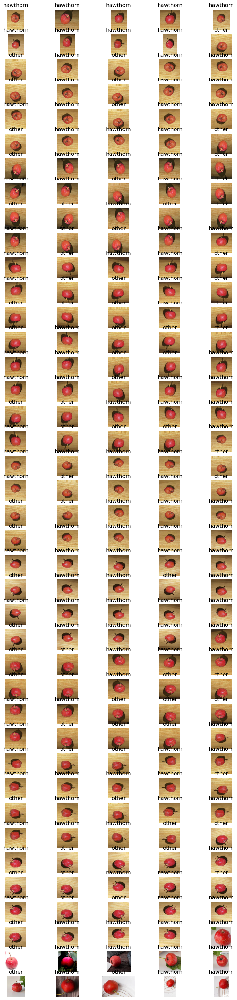

In [88]:
# visualize the resilt
fig2 = plt.figure(figsize=(10,40))
for i in range(40):
    for j in range(5):
        img = load_img(img_path[i*5+j])
        plt.subplot(40,5,i*5+j+1)
        plt.title("hawthorn" if y_predict_kmeans[i*5+j] == normal_hawthorn_id else "other")
        plt.imshow(img)
        plt.axis("off")

预测 测试集

In [89]:
# list all the names of the data
import os 
folder_test = r"./dataset/trainsferlearning/test_data"
dirs_test = os.listdir(folder_test)
# print(dirs_test)
img_path_test = []
for i in dirs_test:
    if os.path.splitext(i)[1] == ".jpg":
        img_path_test.append(f'{folder_test}/{i}')
print(img_path_test[0])
print(len(img_path_test))

./dataset/trainsferlearning/test_data/1.jpg
20


In [90]:
#数据处理
features_test = np.zeros([len(img_path_test),7*7*512])
for i in range(len(img_path_test)):
    features_i = modelProcess(img_path_test[i],model_vgg)
    print("preprocessed:",img_path_test[i])
    features_test[i] = features_i

1/1 [==============================] - 0s 157ms/step
preprocessed: ./dataset/trainsferlearning/test_data/1.jpg
1/1 [==============================] - 0s 151ms/step
preprocessed: ./dataset/trainsferlearning/test_data/2.jpg
1/1 [==============================] - 0s 147ms/step
preprocessed: ./dataset/trainsferlearning/test_data/3.jpg
1/1 [==============================] - 0s 150ms/step
preprocessed: ./dataset/trainsferlearning/test_data/4.jpg
1/1 [==============================] - 0s 145ms/step
preprocessed: ./dataset/trainsferlearning/test_data/5.jpg
1/1 [==============================] - 0s 148ms/step
preprocessed: ./dataset/trainsferlearning/test_data/6.jpg
1/1 [==============================] - 0s 148ms/step
preprocessed: ./dataset/trainsferlearning/test_data/7.jpg
1/1 [==============================] - 0s 156ms/step
preprocessed: ./dataset/trainsferlearning/test_data/8.jpg
1/1 [==============================] - 0s 156ms/step
preprocessed: ./dataset/trainsferlearning/test_data/9.jpg
1

In [91]:
X_test = features_test
print(X_test.shape)

(20, 25088)


In [92]:
#预测
y_predict_kmeans_test = cnn_kmeans.predict(X_test)
print(y_predict_kmeans_test)

[0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 0 0 0 0]


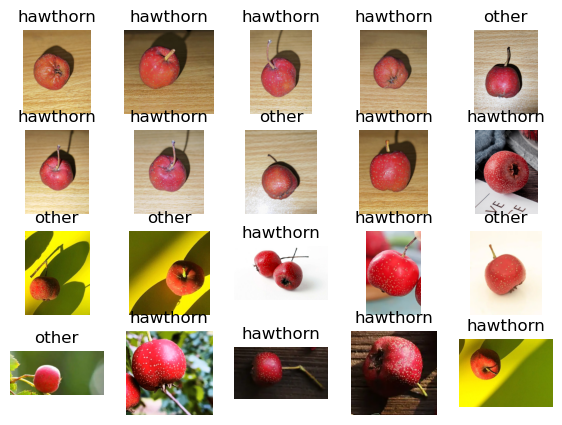

In [93]:
# visualize the resilt
fig3 = plt.figure(figsize=(7,5))
for i in range(4):
    for j in range(5):
        img = load_img(img_path_test[i*5+j])
        plt.subplot(4,5,i*5+j+1)
        plt.title("hawthorn" if y_predict_kmeans_test[i*5+j] == normal_hawthorn_id else "other")
        plt.imshow(img)
        plt.axis("off")

效果不太好


In [94]:
# meanShift
from sklearn.cluster import MeanShift,estimate_bandwidth
# obtain the bandwidth
bw = estimate_bandwidth(X,n_samples = 140)
print(bw)
# set up meanshift model
cnn_ms = MeanShift(bandwidth = bw)
cnn_ms.fit(X)

1195.5868841777158


MeanShift(bandwidth=1195.5868841777158)

In [95]:
# make prediction
y_predict_ms = cnn_ms.predict(X)
print(y_predict_ms)

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  4  7
  6  2  5  9  0  3 10  8]


In [96]:
#統計預測結果
print(Counter(y_predict_ms))

Counter({0: 190, 1: 1, 4: 1, 7: 1, 6: 1, 2: 1, 5: 1, 9: 1, 3: 1, 10: 1, 8: 1})


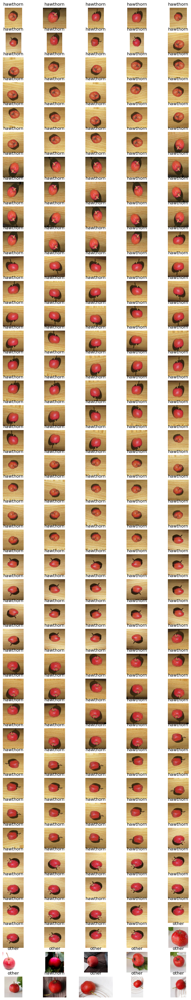

In [97]:
fig4 = plt.figure(figsize=(10,50))
for i in range(40):
    for j in range(5):
        img = load_img(img_path[i*5+j])
        plt.subplot(40,5,i*5+j+1)
        plt.title("hawthorn" if y_predict_ms[i*5+j] == normal_hawthorn_id else "other")
        plt.imshow(img)
        plt.axis("off")

In [98]:
#预测 测试集
y_predict_ms_test = cnn_ms.predict(X_test)
print(y_predict_ms_test)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


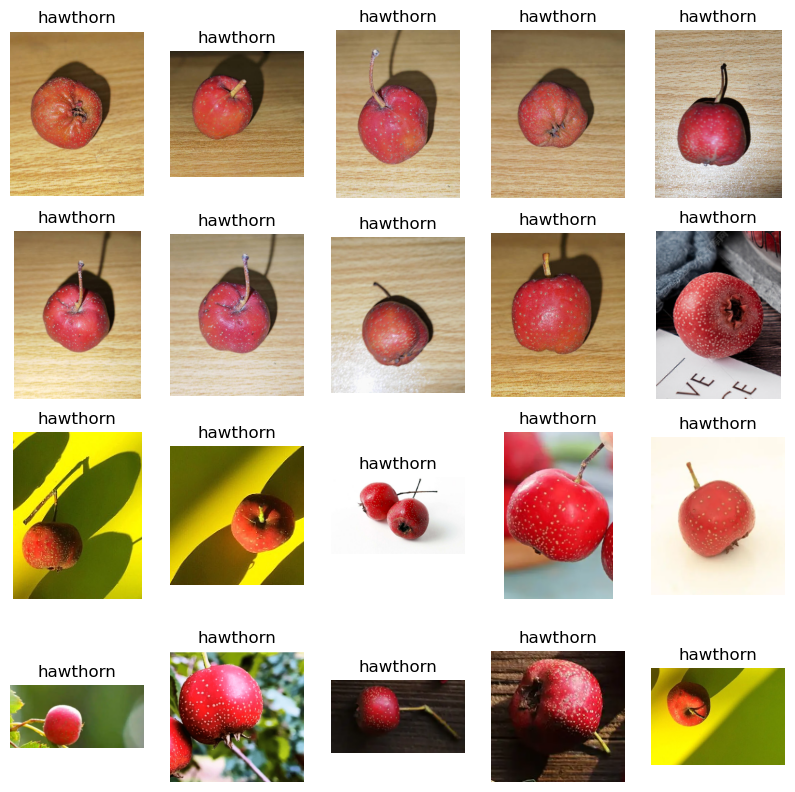

In [99]:
# visualize the resilt
fig5 = plt.figure(figsize=(10,10))
for i in range(4):
    for j in range(5):
        img = load_img(img_path_test[i*5+j])
        plt.subplot(4,5,i*5+j+1)
        plt.title("hawthorn" if y_predict_ms_test[i*5+j] == normal_hawthorn_id else "other")
        plt.imshow(img)
        plt.axis("off")

過擬合了啊

In [100]:
# PCA 降維
from sklearn.preprocessing import StandardScaler
stds = StandardScaler()
X_norm = stds.fit_transform(X)
# PCA analusis
from sklearn.decomposition import PCA
pca = PCA(n_components=200)
X_pca = pca.fit_transform(X_norm)

In [101]:
#calculate the variance ratio of each components
var_ratio = pca.explained_variance_ratio_
print(np.sum(var_ratio))

1.0


In [102]:
print(X_pca.shape,X.shape)

(200, 200) (200, 25088)


In [103]:
#再meanshift
from sklearn.cluster import MeanShift,estimate_bandwidth
# obtain the bandwidth
bw = estimate_bandwidth(X_pca,n_samples=140) #用处理后的数据
print(bw)
# set up meanshift model
cnn_pca_ms = MeanShift(bandwidth=bw)
cnn_pca_ms.fit(X_pca)

162.23990024043636


MeanShift(bandwidth=162.23990024043636)

In [104]:
# make prediction
y_predict_pca_ms = cnn_pca_ms.predict(X_pca)
print(y_predict_pca_ms)

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0 12  0  0  0  0  0  0  0  0  0  0 13  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0 14  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  8 11  3
  2  5  9 10  7  1  6  4]


In [105]:
# 統計預測結果
print(Counter(y_predict_pca_ms))

Counter({0: 186, 12: 1, 13: 1, 14: 1, 8: 1, 11: 1, 3: 1, 2: 1, 5: 1, 9: 1, 10: 1, 7: 1, 1: 1, 6: 1, 4: 1})


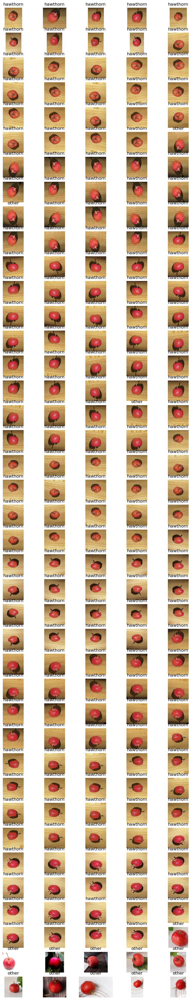

In [106]:
fig6 = plt.figure(figsize=(10,50))
for i in range(40):
    for j in range(5):
        img = load_img(img_path[i*5+j])
        plt.subplot(40,5,i*5+j+1)
        plt.title("hawthorn" if y_predict_pca_ms[i*5+j] == normal_hawthorn_id else "other")
        plt.imshow(img)
        plt.axis("off")

In [107]:
#数据转换
X_norm_test = stds.transform(X_test)
X_pca_test = pca.transform(X_norm_test)

In [108]:
#预测 测试集
y_predict_pca_ms_test = cnn_pca_ms.predict(X_pca_test)
print(y_predict_pca_ms_test)
# 統計預測結果
print(Counter(y_predict_pca_ms_test))

[ 0  0  0  0  0  0  0  0  0  3  4 12  0  8  0  1  3  0  1 11]
Counter({0: 12, 3: 2, 1: 2, 4: 1, 12: 1, 8: 1, 11: 1})


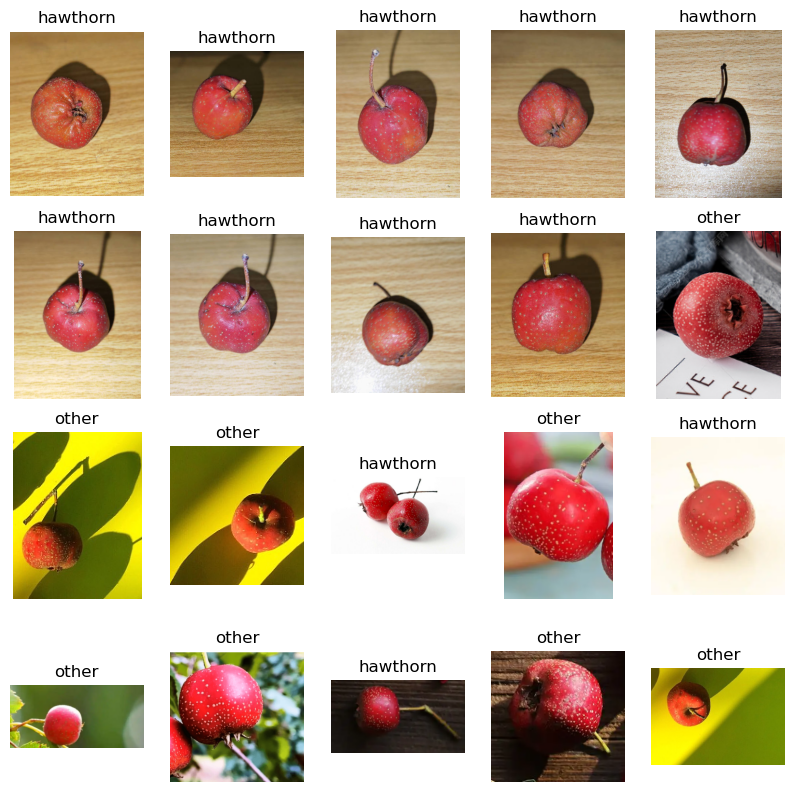

In [109]:
# visualize the resilt
fig7 = plt.figure(figsize=(10,10))
for i in range(4):
    for j in range(5):
        img = load_img(img_path_test[i*5+j])
        plt.subplot(4,5,i*5+j+1)
        plt.title("hawthorn" if y_predict_pca_ms_test[i*5+j] == normal_hawthorn_id else "other")
        plt.imshow(img)
        plt.axis("off")

有85%的準確率了

**普通/其他山楂檢測實戰summary**
1. 通過搭建混合模型,實現監督+無監督、機器+深度學習技術的有機結合，並在少樣本的情況下建立起了有效區分普通/其他山楂的模型
1. 針對少樣本任務，掌握生成新數據的數據增強方法
1. 更熟練的掌握了拆分經典VGG16模型並用於提取圖像特徵的方法
1. 完成了圖像的批量處理
1. 回顧了無監督聚類算法:KMeans、Meanshift，並通過標簽數據分布實現數據類別矯正
1. 成功引入PCA數據降維技術，剔除數據中的噪音信息、降低模型復雜度、減少模型訓練時間，最終提高模型表現
1. 考慮一些其他方法去完成任務，比如異常數據檢測技術